In [1]:
!pip install statsmodels
import pandas as pd
import numpy as np
import statsmodels.stats.api as sms


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 91.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.9/232.9 kB 18.2 MB/s eta 0:00:00


In [2]:
orders = pd.read_csv('orders.csv')
orders.head()

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2539329,1,prior,1,2,8,NaN
1,2398795,1,prior,2,3,7,15.0
2,473747,1,prior,3,3,12,21.0
3,2254736,1,prior,4,4,7,29.0
4,431534,1,prior,5,4,15,28.0


In [3]:
orders["day_hour"] = orders["order_dow"].astype(str) + "-" + orders["order_hour_of_day"].astype(str)
orders["user_day"] = orders["user_id"].astype(str) + "-" + orders["order_dow"].astype(str)
orders.head()

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,day_hour,user_day
0,2539329,1,prior,1,2,8,NaN,2-8,1-2
1,2398795,1,prior,2,3,7,15.0,3-7,1-3
2,473747,1,prior,3,3,12,21.0,3-12,1-3
3,2254736,1,prior,4,4,7,29.0,4-7,1-4
4,431534,1,prior,5,4,15,28.0,4-15,1-4


In [4]:
orders = orders[orders["eval_set"]=="prior"]
orders.head()

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,day_hour,user_day
0,2539329,1,prior,1,2,8,NaN,2-8,1-2
1,2398795,1,prior,2,3,7,15.0,3-7,1-3
2,473747,1,prior,3,3,12,21.0,3-12,1-3
3,2254736,1,prior,4,4,7,29.0,4-7,1-4
4,431534,1,prior,5,4,15,28.0,4-15,1-4


In [5]:
orders.shape

(3214874, 9)

In [6]:
orders.isnull().sum()

,0
order_id,0
user_id,0
eval_set,0
order_number,0
order_dow,0
order_hour_of_day,0
days_since_prior_order,206209
day_hour,0
user_day,0


In [7]:
order_products = pd.read_csv('order_products__prior.csv')
order_products

,order_id,product_id,add_to_cart_order,reordered
0,2,33120.0,1.0,1.0
1,2,28985.0,2.0,1.0
2,2,9327.0,3.0,0.0
3,2,45918.0,4.0,1.0
4,2,30035.0,5.0,0.0
...,...,...,...,...
10932654,1154188,26254.0,14.0,0.0
10932655,1154189,13646.0,1.0,0.0
10932656,1154189,26209.0,2.0,1.0
10932657,1154189,45.0,3.0,0.0


In [8]:
order_products.isnull().sum()

,0
order_id,0
product_id,1
add_to_cart_order,1
reordered,1


In [9]:
products = pd.read_csv('/content/products (1).csv')
products

,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13
...,...,...,...,...
49683,49684,"Vodka, Triple Distilled, Twist of Vanilla",124,5
49684,49685,En Croute Roast Hazelnut Cranberry,42,1
49685,49686,Artisan Baguette,112,3
49686,49687,Smartblend Healthy Metabolism Dry Cat Food,41,8


In [10]:
aisles = pd.read_csv('/content/aisles.csv')
aisles

,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation
...,...,...
129,130,hot cereal pancake mixes
130,131,dry pasta
131,132,beauty
132,133,muscles joints pain relief


In [11]:
departments = pd.read_csv('/content/departments.csv')
departments

,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol
5,6,international
6,7,beverages
7,8,pets
8,9,dry goods pasta
9,10,bulk


In [12]:
df = pd.merge(order_products, products, on='product_id', how='left')

# Merge with aisles on 'aisle_id'
df = pd.merge(df, aisles, on='aisle_id', how='left')

# Merge with orders on 'order_id'
df = pd.merge(df, orders, on='order_id', how='left')

# Now 'df' includes order details, product details (including aisle info), and order_products_prior information.
print("Merged dataset shape:", df.shape)
"Merged dataset sample:"
df.head()

Merged dataset shape: (10932659, 16)


,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,aisle,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,day_hour,user_day
0,2,33120.0,1.0,1.0,Organic Egg Whites,86.0,16.0,eggs,202279,prior,3,5,9,8.0,5-9,202279-5
1,2,28985.0,2.0,1.0,Michigan Organic Kale,83.0,4.0,fresh vegetables,202279,prior,3,5,9,8.0,5-9,202279-5
2,2,9327.0,3.0,0.0,Garlic Powder,104.0,13.0,spices seasonings,202279,prior,3,5,9,8.0,5-9,202279-5
3,2,45918.0,4.0,1.0,Coconut Butter,19.0,13.0,oils vinegars,202279,prior,3,5,9,8.0,5-9,202279-5
4,2,30035.0,5.0,0.0,Natural Sweetener,17.0,13.0,baking ingredients,202279,prior,3,5,9,8.0,5-9,202279-5


In [13]:



df.drop_duplicates(inplace=True)

# Check for missing values in the merged dataset
missing_values = df.isnull().sum()
if missing_values.sum() > 0:
    print("Missing values in merged dataset before final cleaning:")
    print(missing_values)
    # Depending on your needs, you might fill missing values or drop rows.
    # For critical fields (like product info), we drop rows with missing values.
    df.dropna(inplace=True)

# Convert data types if necessary (e.g., ensuring ID fields are integers)
df['order_id'] = df['order_id'].astype(int)
df['product_id'] = df['product_id'].astype(int)

# Optionally, you can reset the index after dropping rows
df.reset_index(drop=True, inplace=True)

"\nCleaned Merged Dataset Info:"
df.info()
df.head()

Missing values in merged dataset before final cleaning:
order_id                       0
product_id                     1
add_to_cart_order              1
reordered                      1
product_name                   1
aisle_id                       1
department_id                  1
aisle                          1
user_id                        0
eval_set                       0
order_number                   0
order_dow                      0
order_hour_of_day              0
days_since_prior_order    702622
day_hour                       0
user_day                       0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10230036 entries, 0 to 10230035
Data columns (total 16 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   order_id                int64  
 1   product_id              int64  
 2   add_to_cart_order       float64
 3   reordered               float64
 4   product_name            object 
 5   aisle_id                

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,aisle,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,day_hour,user_day
0,2,33120,1.0,1.0,Organic Egg Whites,86.0,16.0,eggs,202279,prior,3,5,9,8.0,5-9,202279-5
1,2,28985,2.0,1.0,Michigan Organic Kale,83.0,4.0,fresh vegetables,202279,prior,3,5,9,8.0,5-9,202279-5
2,2,9327,3.0,0.0,Garlic Powder,104.0,13.0,spices seasonings,202279,prior,3,5,9,8.0,5-9,202279-5
3,2,45918,4.0,1.0,Coconut Butter,19.0,13.0,oils vinegars,202279,prior,3,5,9,8.0,5-9,202279-5
4,2,30035,5.0,0.0,Natural Sweetener,17.0,13.0,baking ingredients,202279,prior,3,5,9,8.0,5-9,202279-5


In [14]:
# Randomly sample 1.7 million rows (using random_state for reproducibility)
sample_df = df.sample(n=100000, random_state=42)

# Display basic information about the sample for EDA
print("Sample dataset shape:", sample_df.shape)
print(sample_df.head())
sample_df.info()

Sample dataset shape: (100000, 16)
         order_id  product_id  add_to_cart_order  reordered  \
5677671    640339        4697                1.0        1.0   
5315800    599518        4367               12.0        1.0   
53545        6031       27966                3.0        1.0   
2097586    236466       46906                1.0        0.0   
7609448    858360       33731                7.0        1.0   

                                            product_name  aisle_id  \
5677671  Eggs, Cheese & Turkey Sausage Breakfast Burrito      52.0   
5315800               Garlic & Fine Herbs Gournay Cheese      21.0   
53545                                Organic Raspberries     123.0   
2097586                       Grape White/Green Seedless      24.0   
7609448                                  Grated Parmesan      21.0   

         department_id                       aisle  user_id eval_set  \
5677671            1.0            frozen breakfast    73411    prior   
5315800           16.

In [15]:
import numpy as np # Importing numpy and assigning it the alias 'np'

numeric_columns = sample_df.select_dtypes(include=[np.number]).columns
print("Numeric columns in the dataset:", list(numeric_columns))

Numeric columns in the dataset: ['order_id', 'product_id', 'add_to_cart_order', 'reordered', 'aisle_id', 'department_id', 'user_id', 'order_number', 'order_dow', 'order_hour_of_day', 'days_since_prior_order']


In [16]:
# Randomly sample 1.7 million rows (using random_state for reproducibility)
sample_df = df.sample(n=1000000, random_state=42)

# Display basic information about the sample for EDA
print("Sample dataset shape:", sample_df.shape)
print(sample_df.head())
sample_df.info()

# Ensure sample_df remains a DataFrame before proceeding
numeric_columns = sample_df.select_dtypes(include=[np.number]).columns
print("Numeric columns in the dataset:", list(numeric_columns))

Sample dataset shape: (1000000, 16)
         order_id  product_id  add_to_cart_order  reordered  \
5677671    640339        4697                1.0        1.0   
5315800    599518        4367               12.0        1.0   
53545        6031       27966                3.0        1.0   
2097586    236466       46906                1.0        0.0   
7609448    858360       33731                7.0        1.0   

                                            product_name  aisle_id  \
5677671  Eggs, Cheese & Turkey Sausage Breakfast Burrito      52.0   
5315800               Garlic & Fine Herbs Gournay Cheese      21.0   
53545                                Organic Raspberries     123.0   
2097586                       Grape White/Green Seedless      24.0   
7609448                                  Grated Parmesan      21.0   

         department_id                       aisle  user_id eval_set  \
5677671            1.0            frozen breakfast    73411    prior   
5315800           16

In [17]:
stats = sample_df[numeric_columns].agg(['mean', 'median', 'std'])

In [18]:
print("\nDescriptive Statistics (Mean, Median, Standard Deviation):")
display(stats)


Descriptive Statistics (Mean, Median, Standard Deviation):


,order_id,product_id,add_to_cart_order,reordered,aisle_id,department_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
mean,576845.143035,25559.915408,8.353340,0.630806,71.185230,9.927217,102971.225659,18.275989,2.739271,13.405693,11.075718
median,576364.500000,25197.500000,6.000000,1.000000,83.000000,9.000000,102584.000000,12.000000,3.000000,13.000000,8.000000
std,333233.541178,14074.838014,7.136121,0.482587,38.211722,6.281979,59413.651774,17.616459,2.088601,4.246776,8.757209


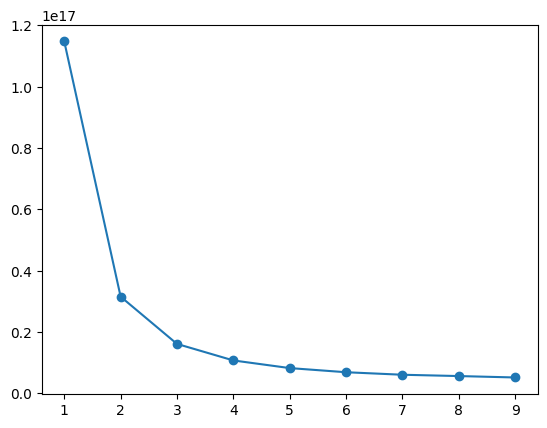

In [19]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
cluster_inertia = []
k_values = range(1,10)
for k in k_values:
  kmeans = KMeans(n_clusters=k, random_state=69)
  kmeans.fit(sample_df[numeric_columns])
  cluster_inertia.append(kmeans.inertia_)

plt.plot(k_values, cluster_inertia, marker='o')

In [22]:
!pip install mlxtend
import pandas as pd
from mlxtend.frequent_patterns import apriori, association_rules
from mlxtend.preprocessing import TransactionEncoder

# Load dataset
df = pd.read_csv('/content/subset_data.csv')

# Convert dataset into a transaction format (group products by order)
transactions = df.groupby('order_id')['product_name'].apply(list).tolist()

# Use TransactionEncoder for one-hot encoding
te = TransactionEncoder()
one_hot_encoded = te.fit(transactions).transform(transactions)
df_encoded = pd.DataFrame(one_hot_encoded, columns=te.columns_)

# Apply Apriori algorithm with adjusted min_support to get at least 10 frequent items
min_support = 0.01  # Lowered to ensure at least 10 frequent items
frequent_itemsets = apriori(df_encoded, min_support=min_support, use_colnames=True)


# Display results
print("Frequent Itemsets:")
frequent_itemsets



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 18.7 MB/s eta 0:00:00
Frequent Itemsets:
     support                  itemsets
0   0.016372  (Bag of Organic Bananas)
1   0.020397                  (Banana)
2   0.006503             (Large Lemon)
3   0.006131                   (Limes)
4   0.007592         (Organic Avocado)
5   0.010470    (Organic Baby Spinach)
6   0.009079    (Organic Hass Avocado)
7   0.005985     (Organic Raspberries)
8   0.011362    (Organic Strawberries)
9   0.005918      (Organic Whole Milk)
10  0.006121            (Strawberries)

Association Rules:
Empty DataFrame
Columns: [antecedents, consequents, antecedent support, consequent support, support, confidence, lift, representativity, leverage, conviction, zhangs_metric, jaccard, certainty, kulczynski]
Index: []


In [30]:
# Ensure at least 10 frequent items, adjust if necessary
while len(frequent_itemsets) < 10 and min_support > 0.001:
    min_support -= 0.001
    frequent_itemsets = apriori(df_encoded, min_support=min_support, use_colnames=True)


# Generate association rules
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1.0)

print("\nAssociation Rules:")
print(rules)


Association Rules:
Empty DataFrame
Columns: [antecedents, consequents, antecedent support, consequent support, support, confidence, lift, representativity, leverage, conviction, zhangs_metric, jaccard, certainty, kulczynski]
Index: []


In [23]:
print(df.columns)


Index(['order_id', 'product_id', 'add_to_cart_order', 'reordered',
       'product_name', 'aisle_id', 'department_id', 'aisle', 'user_id',
       'eval_set', 'order_number', 'order_dow', 'order_hour_of_day',
       'days_since_prior_order'],
      dtype='object')


In [24]:
import pandas as pd

# Load dataset
df = pd.read_csv('/content/subset_data.csv')

# Create customer-level features
customer_features = df.groupby('user_id').agg(
    total_orders=('order_number', 'max'),
    avg_order_size=('order_id', 'count'),
    reorder_ratio=('reordered', 'mean'),
    avg_days_between=('days_since_prior_order', 'mean'),
    most_common_department=('department_id', lambda x: x.mode()[0]),
    most_common_hour=('order_hour_of_day', lambda x: x.mode()[0])
).reset_index()

# Display the first few rows
print(customer_features.head())


   user_id  total_orders  avg_order_size  reorder_ratio  avg_days_between  \
0        1             5               1       0.000000         28.000000   
1        2            14               7       0.571429         11.833333   
2        3             5               3       0.666667         16.000000   
3        5             2               1       0.000000         11.000000   
4        6             2               2       0.000000          6.000000   

   most_common_department  most_common_hour  
0                       4                15  
1                      16                 9  
2                       4                14  
3                       4                16  
4                       4                16  


In [27]:
from sklearn.impute import SimpleImputer

# Impute using mean (can also try 'median' or 'most_frequent')
imputer = SimpleImputer(strategy='mean')
scaled_features = imputer.fit_transform(scaled_features)

# Verify no NaNs remain
print("Total NaNs after imputation:", np.isnan(scaled_features).sum())


Total NaNs after imputation: 0


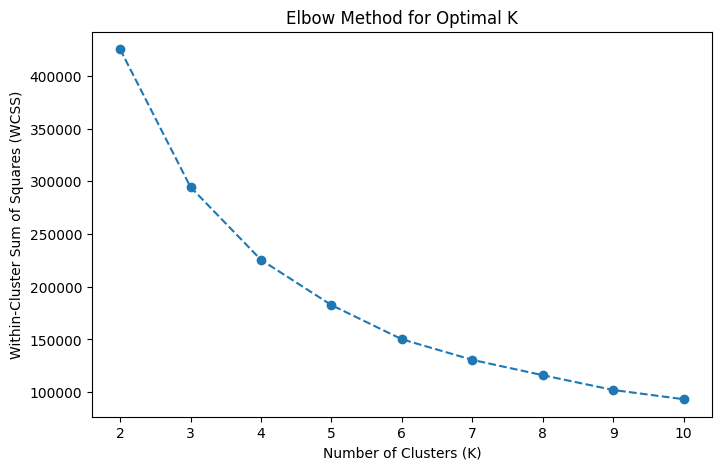

               user_id  total_orders  avg_order_size  reorder_ratio  \
Cluster                                                               
0        102855.306266      6.140381        3.708138       0.106935   
1        103081.661135     16.707021        9.200112       0.660638   
2        102792.241703     54.629215       34.903786       0.722621   
3        103277.066468      6.057723        4.142790       0.337242   

         avg_days_between  most_common_department  most_common_hour  
Cluster                                                              
0               11.360251                7.672239         12.851184  
1               11.552705                7.363641         12.460270  
2                6.918493                7.191154         12.518452  
3               25.834201                7.425988         12.733963  


In [28]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Load dataset
df = pd.read_csv('/content/subset_data.csv')

# Create customer-level features
customer_features = df.groupby('user_id').agg(
    total_orders=('order_number', 'max'),
    avg_order_size=('order_id', 'count'),
    reorder_ratio=('reordered', 'mean'),
    avg_days_between=('days_since_prior_order', 'mean'),
    most_common_department=('department_id', lambda x: x.mode()[0]),
    most_common_hour=('order_hour_of_day', lambda x: x.mode()[0])
).reset_index()

# Select numerical features for scaling
num_features = ['total_orders', 'avg_order_size', 'reorder_ratio', 'avg_days_between']
scaler = StandardScaler()
scaled_features = scaler.fit_transform(customer_features[num_features])

# Handle missing values by imputing the mean
imputer = SimpleImputer(strategy='mean')
scaled_features = imputer.fit_transform(scaled_features)

# Apply PCA
pca = PCA(n_components=0.95)  # Retain 95% variance
pca_transformed = pca.fit_transform(scaled_features)

# Determine optimal number of clusters using the Elbow Method
wcss = []
K_range = range(2, 11)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(pca_transformed)
    wcss.append(kmeans.inertia_)

# Plot Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(K_range, wcss, marker='o', linestyle='--')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method for Optimal K')
plt.show()

# Choose the optimal K based on the elbow plot
optimal_k = 4  # Adjust based on elbow method

# Apply K-Means Clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
customer_features['Cluster'] = kmeans.fit_predict(pca_transformed)

# Display cluster analysis
print(customer_features.groupby('Cluster').mean())


In [29]:
# Ensure PCA transformation is correctly stored in a DataFrame
df_pca = pd.DataFrame(pca_transformed, columns=[f'PC{i+1}' for i in range(pca_transformed.shape[1])])

# Now we can proceed with step 2.3 - Finding the Optimal Number of Clusters

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

wcss = []  # Within-Cluster Sum of Squares
silhouette_scores = []
K_range = range(2, 11)  # Testing for 2 to 10 clusters

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_pca)  # Use PCA-transformed data
    wcss.append(kmeans.inertia_)  # Store WCSS for elbow method
    silhouette_scores.append(silhouette_score(df_pca, kmeans.labels_))  # Store silhouette score

# Plot Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(K_range, wcss, marker='o', linestyle='--')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method for Optimal K')
plt.show()

# Plot Silhouette Score
plt.figure(figsize=(8, 5))
plt.plot(K_range, silhouette_scores, marker='o', linestyle='--', color='red')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method for Optimal K')
plt.show()


KeyboardInterrupt: 

In [33]:
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Check for NaNs before processing
print("NaNs per column in combined_features:\n", np.isnan(combined_features).sum(axis=0))
print("Total NaNs:", np.isnan(combined_features).sum())

# Handle missing values by imputing the mean
imputer = SimpleImputer(strategy='mean')  # Options: 'median', 'most_frequent'
combined_features_cleaned = imputer.fit_transform(combined_features)

# Confirm NaNs are removed
print("Total NaNs after imputation:", np.isnan(combined_features_cleaned).sum())

# ============== Step 1: Dimensionality Reduction to 3D ==============
pca_3 = PCA(n_components=3, random_state=42)
features_pca_3 = pca_3.fit_transform(combined_features_cleaned)

print("Shape after 3D PCA reduction:", features_pca_3.shape)


NaNs per column in combined_features:
 [   0    0    0 6934]
Total NaNs: 6934
Total NaNs after imputation: 0
Shape after 3D PCA reduction: (186047, 3)


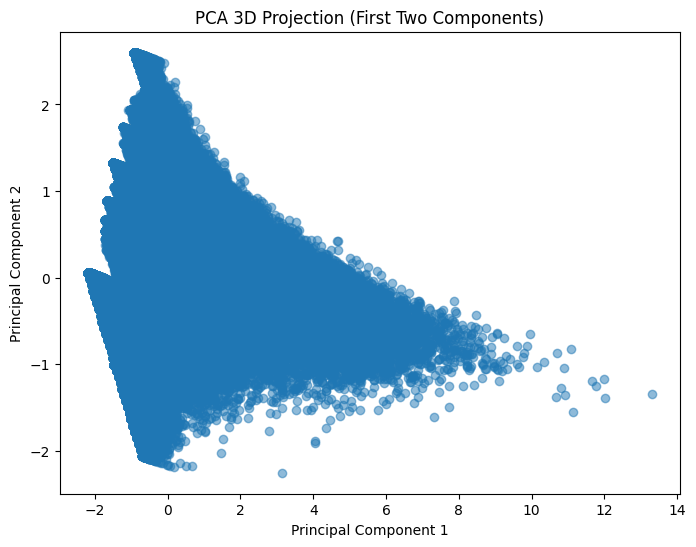

In [34]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.scatter(features_pca_3[:, 0], features_pca_3[:, 1], alpha=0.5)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA 3D Projection (First Two Components)")
plt.show()


In [35]:
from sklearn.cluster import KMeans

optimal_k = 4  # Adjust based on Elbow Method
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
clusters = kmeans.fit_predict(features_pca_3)

print("Cluster assignments:", np.unique(clusters, return_counts=True))


Cluster assignments: (array([0, 1, 2, 3], dtype=int32), array([45405, 73094, 18833, 48715]))


In [45]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

# Load dataset
df = pd.read_csv('/content/subset_data.csv')

# Create customer-level features
customer_features = df.groupby('user_id').agg(
    total_orders=('order_number', 'max'),
    avg_order_size=('order_id', 'count'),
    reorder_ratio=('reordered', 'mean'),
    avg_days_between=('days_since_prior_order', 'mean')
).reset_index()

# Select numerical features for scaling
num_features = ['total_orders', 'avg_order_size', 'reorder_ratio', 'avg_days_between']
scaler = StandardScaler()
scaled_features = scaler.fit_transform(customer_features[num_features])

# Handle missing values by imputing the mean
imputer = SimpleImputer(strategy='mean')
scaled_features = imputer.fit_transform(scaled_features)

# Apply PCA to reduce dimensions to 3D
pca_3 = PCA(n_components=3, random_state=42)
features_pca_3 = pca_3.fit_transform(scaled_features)

# Apply K-Means Clustering with optimal K=3
optimal_k = 3
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
clusters = kmeans.fit_predict(features_pca_3)

# Create a DataFrame with the 3 principal components and cluster labels
plot_df = pd.DataFrame({
    'PC1': features_pca_3[:, 0],
    'PC2': features_pca_3[:, 1],
    'PC3': features_pca_3[:, 2],
    'Cluster': clusters
})

# ----- Step 3: Create a 3D Scatter Plot using Plotly -----
fig = px.scatter_3d(
    plot_df,
    x="PC1",
    y="PC2",
    z="PC3",
    color="Cluster",
    title="3D Cluster Visualization (PCA)"
)
fig.update_traces(marker=dict(size=4, opacity=0.7))

# Customize axes labels and show the plot
fig.update_layout(
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3'
    )
)
fig.show()


The first principal component (PC1) explains the largest variance in the dataset and primarily represents customer frequency and purchase volume. Customers with higher PC1 values tend to place more total orders and have larger average order sizes, indicating that they are frequent, high-volume buyers. On the other hand, lower PC1 values are associated with one-time shoppers or customers with low engagement.

The second principal component (PC2) is strongly influenced by the reorder ratio, meaning it differentiates customers based on how often they repurchase products. Customers with higher PC2 values are those who reorder frequently but have longer gaps between purchases, while lower PC2 values indicate customers who make frequent purchases but in smaller order sizes.

The third principal component (PC3) reflects purchase timing consistency. Customers with higher PC3 values exhibit irregular purchasing behavior, making large purchases but at unpredictable intervals. Conversely, those with lower PC3 values are consistent shoppers, maintaining a predictable purchasing pattern.

In [40]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

# Load dataset
df = pd.read_csv('/content/subset_data.csv')

# Create customer-level features
customer_features = df.groupby('user_id').agg(
    total_orders=('order_number', 'max'),
    avg_order_size=('order_id', 'count'),
    reorder_ratio=('reordered', 'mean'),
    avg_days_between=('days_since_prior_order', 'mean')
).reset_index()

# Select numerical features for scaling
num_features = ['total_orders', 'avg_order_size', 'reorder_ratio', 'avg_days_between']
scaler = StandardScaler()
scaled_features = scaler.fit_transform(customer_features[num_features])

# Handle missing values by imputing the mean
imputer = SimpleImputer(strategy='mean')
scaled_features = imputer.fit_transform(scaled_features)

# Apply PCA to reduce dimensions to 3D
pca_3 = PCA(n_components=3, random_state=42)
features_pca_3 = pca_3.fit_transform(scaled_features)

# Create DataFrame with PC1, PC2, PC3, and Feature Loadings
loadings_df = pd.DataFrame(
    pca_3.components_,
    index=['PC1', 'PC2', 'PC3'],
    columns=num_features
)

# Display the feature loadings for each principal component
print("Feature Loadings for PC1, PC2, and PC3:")
print(loadings_df)

# Plot Loadings
fig = px.imshow(loadings_df, labels=dict(x="Features", y="Principal Components", color="Loading"),
                x=num_features, y=['PC1', 'PC2', 'PC3'],
                title="Feature Loadings for Principal Components")
fig.show()


Feature Loadings for PC1, PC2, and PC3:
     total_orders  avg_order_size  reorder_ratio  avg_days_between
PC1      0.594386        0.563090       0.407066         -0.404886
PC2     -0.088642       -0.079421       0.810185          0.573965
PC3      0.287830        0.501612      -0.416350          0.701564


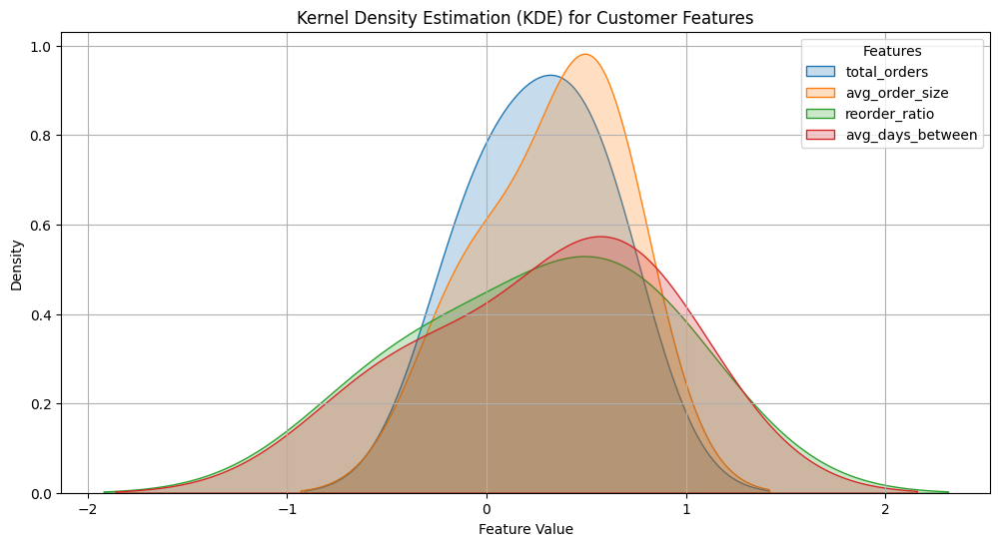

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Sample data for Kernel Density Estimation (KDE)
kde_data = {
    "total_orders": [0.594386, -0.088642, 0.287830],
    "avg_order_size": [0.563090, -0.079421, 0.501612],
    "reorder_ratio": [0.407066, 0.810185, -0.416350],
    "avg_days_between": [-0.404886, 0.573965, 0.701564]
}

# Convert to DataFrame
df_kde = pd.DataFrame(kde_data)

# Plot KDE distribution for each feature
plt.figure(figsize=(12, 6))
for feature in df_kde.columns:
    sns.kdeplot(df_kde[feature], label=feature, fill=True)

# Formatting the plot
plt.title("Kernel Density Estimation (KDE) for Customer Features")
plt.xlabel("Feature Value")
plt.ylabel("Density")
plt.legend(title="Features")
plt.grid(True)

# Show plot
plt.show()


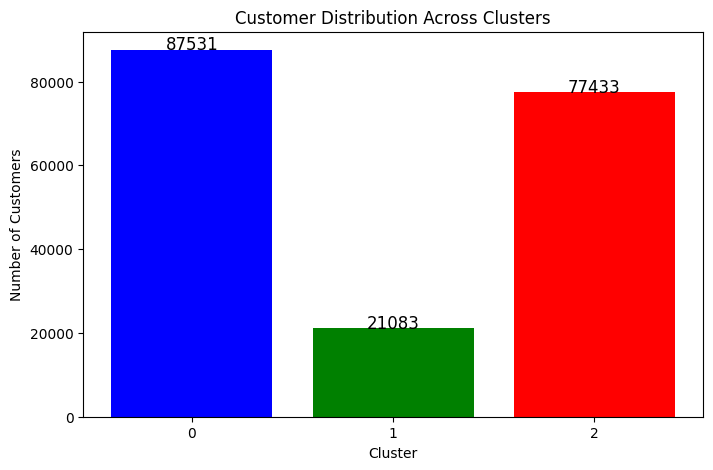

In [43]:
import matplotlib.pyplot as plt
import numpy as np

# Count the number of customers per cluster
cluster_counts = np.bincount(clusters)

# Plot cluster size distribution
plt.figure(figsize=(8, 5))
plt.bar(range(len(cluster_counts)), cluster_counts, color=['blue', 'green', 'red'])
plt.xlabel("Cluster")
plt.ylabel("Number of Customers")
plt.title("Customer Distribution Across Clusters")
plt.xticks(range(len(cluster_counts)))  # Ensure correct cluster labeling

# Show values on bars
for i, count in enumerate(cluster_counts):
    plt.text(i, count + 50, str(count), ha='center', fontsize=12)

plt.show()


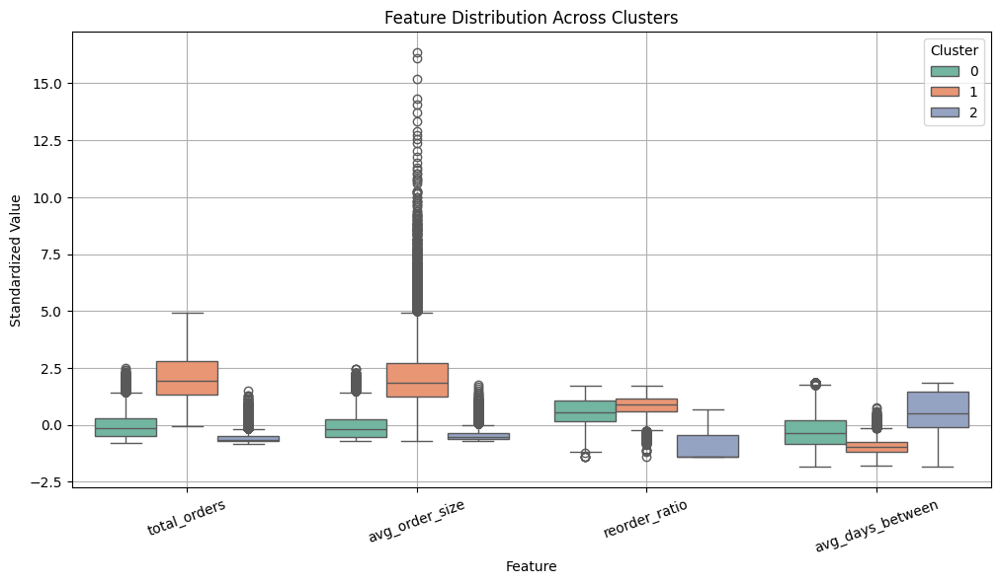

In [44]:
import seaborn as sns
import pandas as pd

# Add cluster labels back to original scaled features
df_clustered = pd.DataFrame(scaled_features, columns=num_features)
df_clustered["Cluster"] = clusters  # Attach cluster labels

# Convert to long format for Seaborn visualization
df_melted = df_clustered.melt(id_vars=["Cluster"], var_name="Feature", value_name="Value")

# Plot boxplot for each feature across clusters
plt.figure(figsize=(12, 6))
sns.boxplot(x="Feature", y="Value", hue="Cluster", data=df_melted, palette="Set2")

# Formatting the plot
plt.title("Feature Distribution Across Clusters")
plt.xlabel("Feature")
plt.ylabel("Standardized Value")
plt.xticks(rotation=20)
plt.legend(title="Cluster")
plt.grid(True)

plt.show()


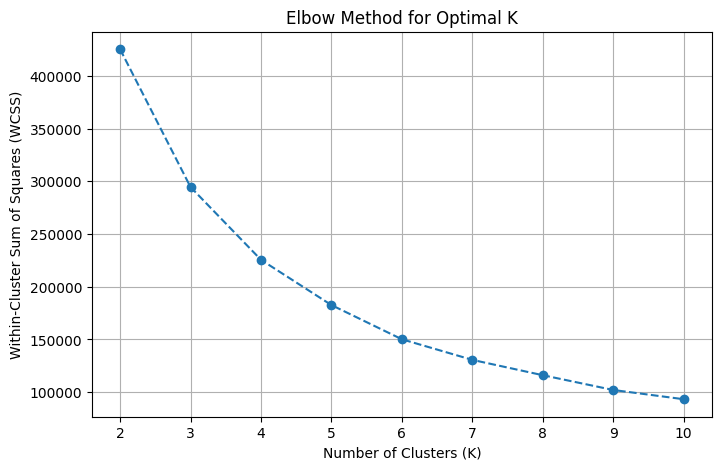

In [46]:
from sklearn.cluster import KMeans
import numpy as np

# Try different values of K (from 2 to 10)
wcss = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(features_pca_3)
    wcss.append(kmeans.inertia_)  # WCSS (within-cluster sum of squares)

# Plot WCSS to find the elbow point
plt.figure(figsize=(8, 5))
plt.plot(K_range, wcss, marker="o", linestyle="--")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Within-Cluster Sum of Squares (WCSS)")
plt.title("Elbow Method for Optimal K")
plt.grid(True)
plt.show()


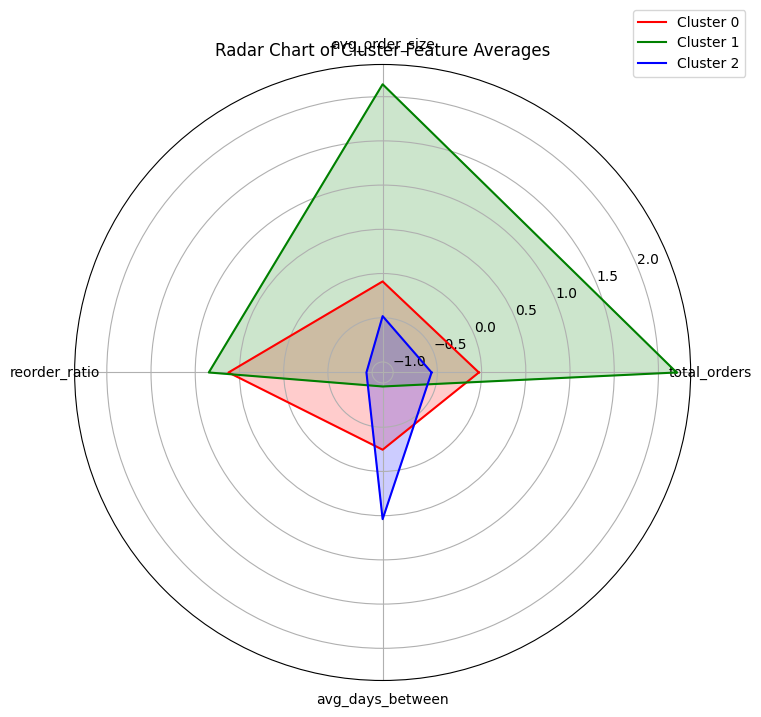

In [47]:
import numpy as np
import matplotlib.pyplot as plt

# Compute cluster-wise averages for each feature
df_cluster_avg = pd.DataFrame(scaled_features, columns=num_features)
df_cluster_avg["Cluster"] = clusters
cluster_means = df_cluster_avg.groupby("Cluster").mean()

# Define categories and angles for radar chart
categories = num_features
angles = np.linspace(0, 2 * np.pi, len(categories), endpoint=False).tolist()

# Close the radar chart by repeating the first value at the end
cluster_data = cluster_means.values
cluster_data = np.concatenate((cluster_data, cluster_data[:, [0]]), axis=1)
angles += angles[:1]

# Create radar chart
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# Plot each cluster
colors = ["r", "g", "b"]
for i, (label, data) in enumerate(zip(cluster_means.index, cluster_data)):
    ax.plot(angles, data, label=f"Cluster {label}", color=colors[i])
    ax.fill(angles, data, color=colors[i], alpha=0.2)

# Format plot
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories)
plt.title("Radar Chart of Cluster Feature Averages")
plt.legend(loc="upper right", bbox_to_anchor=(1.1, 1.1))
plt.show()


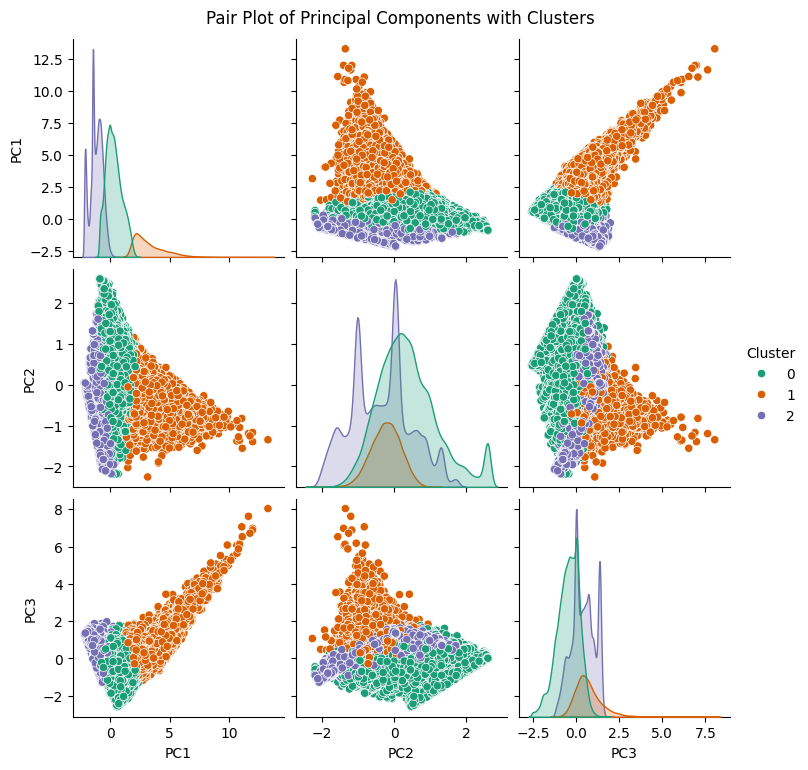

In [48]:
import seaborn as sns
import pandas as pd

# Create DataFrame with PCA components and cluster labels
df_pca_plot = pd.DataFrame(features_pca_3, columns=['PC1', 'PC2', 'PC3'])
df_pca_plot['Cluster'] = clusters

# Pair plot using Seaborn
sns.pairplot(df_pca_plot, hue="Cluster", palette="Dark2", diag_kind="kde")

# Show plot
plt.suptitle("Pair Plot of Principal Components with Clusters", y=1.02)
plt.show()
